# Import and Set Paths

In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import statistics 
from scipy.stats import skew
import numpy as np
import pandas as pd
from google.oauth2 import service_account #Control API Keys
from google.cloud import vision
from pdf2image import convert_from_path #Libary convert pdf file to img file
import os
import io
import random
from random import randrange
from IPython.display import Image
from shapely.geometry import Polygon
import argparse
from enum import Enum
import io
from google.cloud.vision import types
from PIL import Image, ImageDraw
from PIL import ImageFont
from pyresparser import ResumeParser
import shutil
from shutil import copyfile
import random
import spacy
nlp = spacy.load("en_core_web_sm")

In [3]:
doc = '/Users/kunal/Documents/VdartResumeProject/VisionAPi/Document_402.pdf'
docPath = '/Users/kunal/Documents/VdartResumeProject/VisionAPi/'
imgTxtVisionAPIPath = "/Users/kunal/Documents/VdartResumeProject/APIKEYSGOOGLE/resumeMatcher-pdf2img.json"
pdfIMGPopplerPath = '/Users/kunal/Documents/VdartResumeProject/Poppler/poppler-0.68.0_x86/poppler-0.68.0/bin/'
fontPath = '/Users/kunal/Documents/VdartResumeProject/Font/FreeMonoBold.ttf'
allResumesPath = "/Users/kunal/Documents/VdartResumeProject/50_resumes/"

# Create Img

In [4]:
def convert_pdf_2_image(uploaded_image_path, uploaded_image):
    #Using the convert_from_path function
    #Same name as pdf but converted to img
    #Watch out for poppler -- necceasary to function
    os.chdir(uploaded_image_path) # Change the working diretory to path that contains the PDF file
    file_name = str(uploaded_image).replace('.pdf','') # file name for png still going to get changed later
    pages = convert_from_path(uploaded_image, 200,poppler_path=pdfIMGPopplerPath) #function to change pdf to img
    pageNumCount = 1 #numbering for all the different images if pdf is multiple pages
    outputNames = []
    for page in pages:
        output_file = file_name+"_"+str(pageNumCount) + '.jpg'#uptaded name for image
        page.save(output_file, 'JPEG')#save img
        pageNumCount +=1
        outputNames.append(output_file)
    return outputNames #names of img

In [9]:
for i in os.listdir(docPath): 
    if i.endswith(".pdf"):
        print(i)

In [5]:
#Makes a folder and create images of each page in PDF document
textList = []
numberPagesList = []
pathsforAllImages = []
for i in os.listdir(docPath): 
    if i.endswith(".pdf"):# only runs the file that was choosen by user
        newPathGroupforPDF = []
        os.chdir(docPath) 
        folderNameCreate = docPath+"Fold_"+i[:-4]+"/" 
        print(folderNameCreate)
        os.mkdir(folderNameCreate) #Create folder
        shutil.move(i,folderNameCreate) #MovePDF into folder
        os.chdir(folderNameCreate)
        for j in os.listdir(folderNameCreate):
            print(j)
            if j.endswith(".pdf"): 
                imgName = convert_pdf_2_image(folderNameCreate, j) #call pdf2img function
                for i in imgName:
                    newPathGroupforPDF.append(folderNameCreate+i)
                print("Running Number: " + str(len(imgName))) 
                printString = ""
                for docName in imgName: # for making the printing better
                    printString += docName + " " 
                print(printString) 
        pathsforAllImages.append(newPathGroupforPDF)

In [6]:
pathsforAllImages

[]

# Display Document Img

In [5]:
imagePath = '/Users/kunal/Documents/VdartResumeProject/VisionAPi/Document_402_1.jpg'

In [6]:
#Using API from Google
#Returns a JSON file but text is extracted from it
keyDIR = imgTxtVisionAPIPath #JSON key file to call the api
credentials = service_account.Credentials.from_service_account_file(keyDIR) #using service account to go through google
client = vision.ImageAnnotatorClient(credentials=credentials) # client api

# Get base information

In [7]:
datatoExcel = []

In [8]:
with io.open(imagePath, 'rb') as image_file: #opening and reading img
    content = image_file.read() 
image = vision.types.Image(content=content) 
response2 = client.label_detection(image=image)
for annotation in response2.label_annotations:
    print(annotation.description + "\t-->\t" + str(annotation.score)) #MID is a knowlege graph
    datatoExcel.append([annotation.description, annotation.score*100])

Text	-->	0.988566517829895
Document	-->	0.9100102782249451
Font	-->	0.804016649723053
Paper	-->	0.7652196884155273


In [9]:
response4 = client.document_text_detection(image = image)
for i in response4.full_text_annotation.pages:
    widthForEntireDocument = i.width
    heightForEntireDocument = i.height
    print("WIDTH: " + str(i.width))
    print("HEIGHT: " + str(i.height))
datatoExcel.append(["WIDTH", widthForEntireDocument])
datatoExcel.append(["HEIGHT", heightForEntireDocument])

WIDTH: 1654
HEIGHT: 2339


In [10]:
langConfid = []
for i in response4.full_text_annotation.pages:
    #print(i.property.detected_languages)
    for lang in i.property.detected_languages:
        currentLangConfid = []
        currentLangConfid.append(lang.language_code)
        #print(lang.confidence)
        currentLangConfid.append(lang.confidence)
        langConfid.append(currentLangConfid)

In [11]:
#response3 = client.crop_hints(image = image)

In [12]:
print(langConfid)

[['en', 0.9599999785423279], ['pt', 0.019999999552965164]]


In [13]:
for i in langConfid:
    datatoExcel.append([i[0], i[1]*100])

In [14]:
#NOT REALLY HELPFUL
#response3

In [15]:
datatoExcel

[['Text', 98.8566517829895],
 ['Document', 91.0010278224945],
 ['Font', 80.4016649723053],
 ['Paper', 76.52196884155273],
 ['WIDTH', 1654],
 ['HEIGHT', 2339],
 ['en', 95.99999785423279],
 ['pt', 1.9999999552965164]]

In [16]:
pd.DataFrame(datatoExcel, columns=['Info', 'Value'])

,Info,Value
0,Text,98.856652
1,Document,91.001028
2,Font,80.401665
3,Paper,76.521969
4,WIDTH,1654.000000
5,HEIGHT,2339.000000
6,en,95.999998
7,pt,2.000000


# Call API and get boundingBoxes

In [17]:
print(imagePath)

/Users/kunal/Documents/VdartResumeProject/VisionAPi/Document_402_1.jpg


In [18]:
keyDIR = imgTxtVisionAPIPath #JSON key file to call the api
credentials = service_account.Credentials.from_service_account_file(keyDIR) #using service account to go through google
client = vision.ImageAnnotatorClient(credentials=credentials) # client api
bounds = []
with io.open(imagePath, 'rb') as image_file:
    content = image_file.read()
image = types.Image(content=content)
response = client.document_text_detection(image=image)
document = response.full_text_annotation

## Functions

In [19]:
class FeatureType(Enum):
    PAGE = 1
    BLOCK = 2
    PARA = 3
    WORD = 4
    SYMBOL = 5
def get_document_bounds(image_file, feature):
    """Returns document bounds given an image."""
    #Using API from Google
    #Returns a JSON file but text is extracted from it
    bounds = []
    # Collect specified feature bounds by enumerating all document features
    for page in document.pages:
        for block in page.blocks:
            for paragraph in block.paragraphs:
                for word in paragraph.words:
                    for symbol in word.symbols:
                        if (feature == FeatureType.SYMBOL):
                            bounds.append(symbol.bounding_box)
                    if (feature == FeatureType.WORD):
                        bounds.append(word.bounding_box)
                if (feature == FeatureType.PARA):
                    bounds.append(paragraph.bounding_box)
            if (feature == FeatureType.BLOCK):
                bounds.append(block.bounding_box)
 
    return bounds
def getBoundingBoxes(filein):
    image = Image.open(filein)
    
    allb = []
    boundsB = get_document_bounds(filein, FeatureType.BLOCK)
    allb.append(boundsB)
    boundsPara = get_document_bounds(filein, FeatureType.PARA)
    allb.append(boundsPara)
    boundsWord = get_document_bounds(filein, FeatureType.WORD)
    allb.append(boundsWord)

    return allb

In [20]:
def draw_boxes(image, bounds, color):
    """Draw a border around the image using the hints in the vector list."""
    draw = ImageDraw.Draw(image)

    for bound in bounds:
        draw.polygon([
            bound.vertices[0].x, bound.vertices[0].y,
            bound.vertices[1].x, bound.vertices[1].y,
            bound.vertices[2].x, bound.vertices[2].y,
            bound.vertices[3].x, bound.vertices[3].y], None, color)
    return image
def render_doc_text(filein):
    image = Image.open(filein)
    bounds = get_document_bounds(filein, FeatureType.BLOCK)
    draw_boxes(image, bounds, 'blue')
    bounds = get_document_bounds(filein, FeatureType.PARA)
    draw_boxes(image, bounds, 'red')
    bounds = get_document_bounds(filein, FeatureType.WORD)
    draw_boxes(image, bounds, 'yellow')
    #if fileout != 0:
        #image.save(fileout)
    #else:
    image.show()

In [21]:
image_file = imagePath

## Draw img using bounding boxes

In [22]:
#displayIMG
#render_doc_text(filein = image_file)

## Call function and get base info

In [23]:
boundBoxAll = getBoundingBoxes(imagePath)

In [24]:
print("Blocks\t\t"+str(len(boundBoxAll[0]))+"\nParagraghs\t\t"+str(len(boundBoxAll[1]))+"\nWords\t\t"+str(len(boundBoxAll[2])))

Blocks		39
Paragraghs		43
Words		644


# Find Area

In [21]:
def findArea(bounds):
    matrix = ((bounds.vertices[0].x, bounds.vertices[0].y),
              (bounds.vertices[1].x, bounds.vertices[1].y),
              (bounds.vertices[2].x, bounds.vertices[2].y),
              (bounds.vertices[3].x, bounds.vertices[3].y))    
    polygon = Polygon(matrix)
    return polygon.area

# Draw outline

In [26]:
def draw_single_box(image, bounds):
    """Draw a border around the image using the hints in the vector list."""
    draw = ImageDraw.Draw(image)

    draw.polygon([
        bounds.vertices[0].x, bounds.vertices[0].y,
        bounds.vertices[1].x, bounds.vertices[1].y,
        bounds.vertices[2].x, bounds.vertices[2].y,
        bounds.vertices[3].x, bounds.vertices[3].y],outline=(0,0,0,255))
    return image

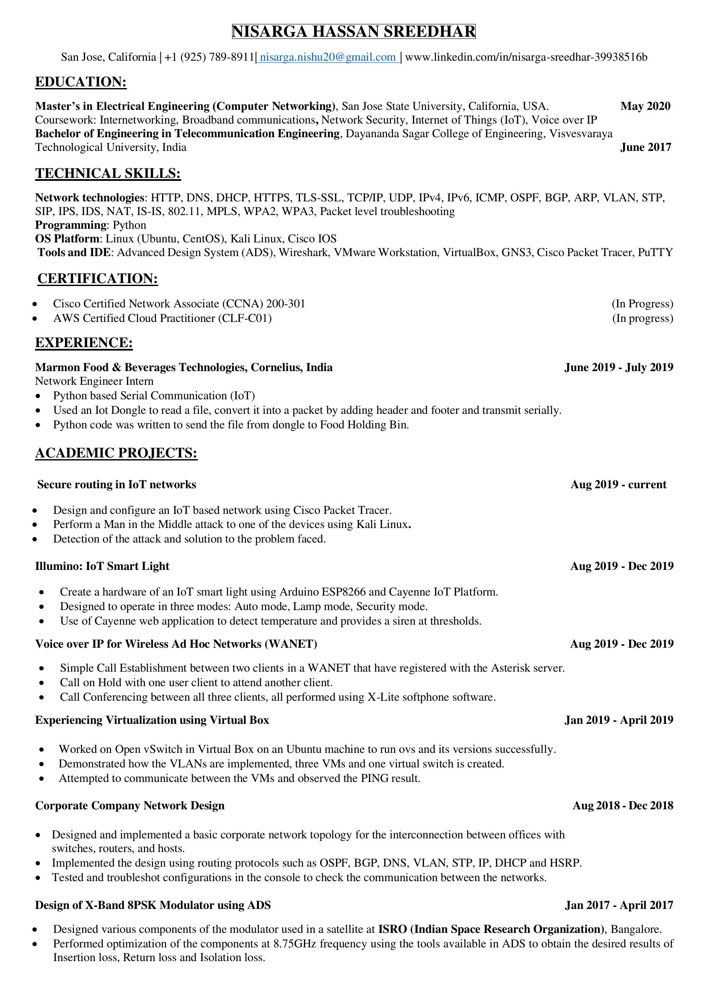

In [27]:
image = Image.open(imagePath)
findArea(boundBoxAll[0][0])
draw_single_box(image, boundBoxAll[0][0])

# Draw Translucent Box

In [28]:
def drawsingleBoxVertice(imagefile, color, transp, vertices):
    bounds = vertices
    matrix = ((bounds.vertices[0].x, bounds.vertices[0].y),
              (bounds.vertices[1].x, bounds.vertices[1].y),
              (bounds.vertices[2].x, bounds.vertices[2].y),
              (bounds.vertices[3].x, bounds.vertices[3].y))    
    TINT_COLOR = color
    TRANSPARENCY = transp
    OPACITY = int(255 * TRANSPARENCY)
    img = Image.open(imagefile)
    img = img.convert("RGBA")
    overlay = Image.new('RGBA', img.size, TINT_COLOR+(0,))
    draw = ImageDraw.Draw(overlay)  # Create a context for drawing things on it.
    draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
    img = Image.alpha_composite(img, overlay)
    img = img.convert("RGB") # Remove alpha for saving in jpg format.
    return img

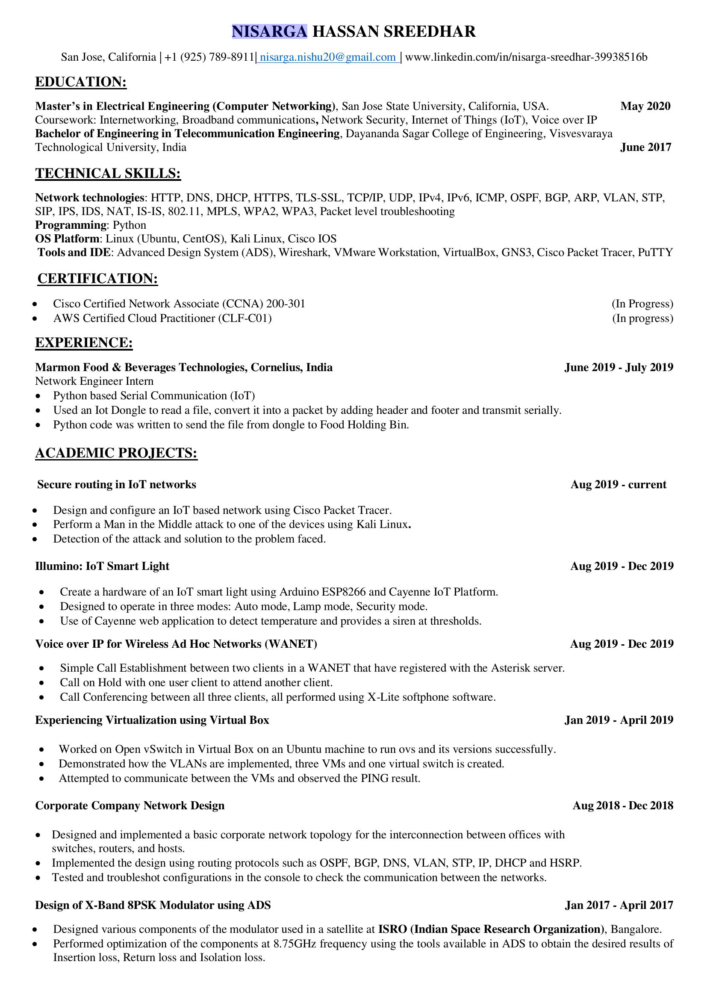

In [29]:
drawsingleBoxVertice(imagePath, (0,0,255), 0.25, boundBoxAll[2][0])

# Color all objects in pic

In [108]:
def findMatrix(vert):
    matrix = ((vert.vertices[0].x, vert.vertices[0].y),
              (vert.vertices[1].x, vert.vertices[1].y),
              (vert.vertices[2].x, vert.vertices[2].y),
              (vert.vertices[3].x, vert.vertices[3].y))
    return matrix

In [109]:
def colorALL(image_file, boundBoxAll):
    TINT_COLOR = (0,0,0) 
    #colors = [(0,255,0), (0,0,255), (255,0,0)]
    TRANSPARENCY = 0.25
    OPACITY = int(255 * TRANSPARENCY)
    img = Image.open(image_file)
    img = img.convert("RGBA")
    overlay = Image.new('RGBA', img.size, TINT_COLOR+(0,))
    draw = ImageDraw.Draw(overlay)  # Create a context for drawing things on it.
    #for section in boundBoxAll:
    TINT_COLOR = (0,255,0) 
    for block in boundBoxAll[0]:
        matrix = findMatrix(block)
        draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
    TINT_COLOR = (0,0,255)
    for para in boundBoxAll[1]:
        matrix = findMatrix(para)
        draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
    TINT_COLOR = (255,0,0)
    for word in boundBoxAll[2]:
        matrix = findMatrix(word)
        draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
    img = Image.alpha_composite(img, overlay)
    img = img.convert("RGB") # Remove alpha for saving in jpg format.
    return img

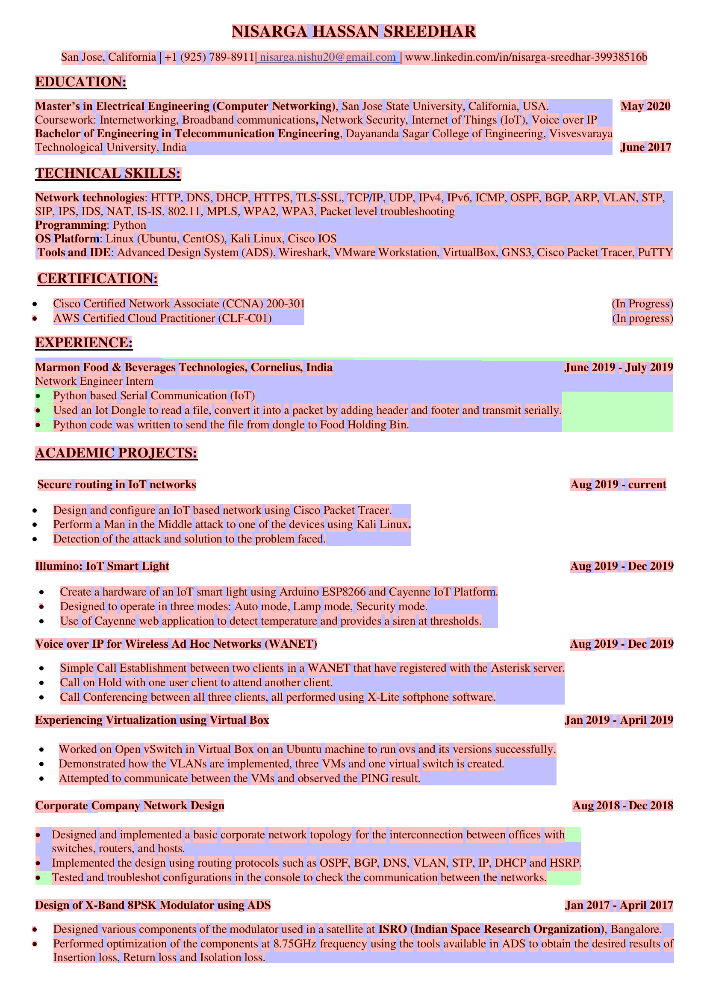

In [110]:
colorALL(imagePath, boundBoxAll)

# Highlight Skills

In [111]:
def colorAllSkills(imagefile, listofSkills, document):
    allWords = []
    boxesForSkills = []
    for page in document.pages:
        for block in page.blocks:
            for paragraph in block.paragraphs:
                for word in paragraph.words:
                    wordRun = ""
                    for symbol in word.symbols:
                        wordRun+=symbol.text
                    allWords.append(wordRun)
                    if wordRun in listofSkills:
                        boxesForSkills.append(word.bounding_box)
    TINT_COLOR = (0,0,0) 
    #colors = [(0,255,0), (0,0,255), (255,0,0)]
    TRANSPARENCY = 0.25
    OPACITY = int(255 * TRANSPARENCY)
    img = Image.open(imagefile)
    img = img.convert("RGBA")
    overlay = Image.new('RGBA', img.size, TINT_COLOR+(0,))
    draw = ImageDraw.Draw(overlay)  # Create a context for drawing things on it.
    #for section in boundBoxAll:
    TINT_COLOR = (0,255,0) 
    for para in boxesForSkills:
        matrix = findMatrix(para)
        draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
    img = Image.alpha_composite(img, overlay)
    img = img.convert("RGB") # Remove alpha for saving in jpg format.
    return img

In [112]:
skills = ["Internetworking", "Ubuntu", "CentOS"]

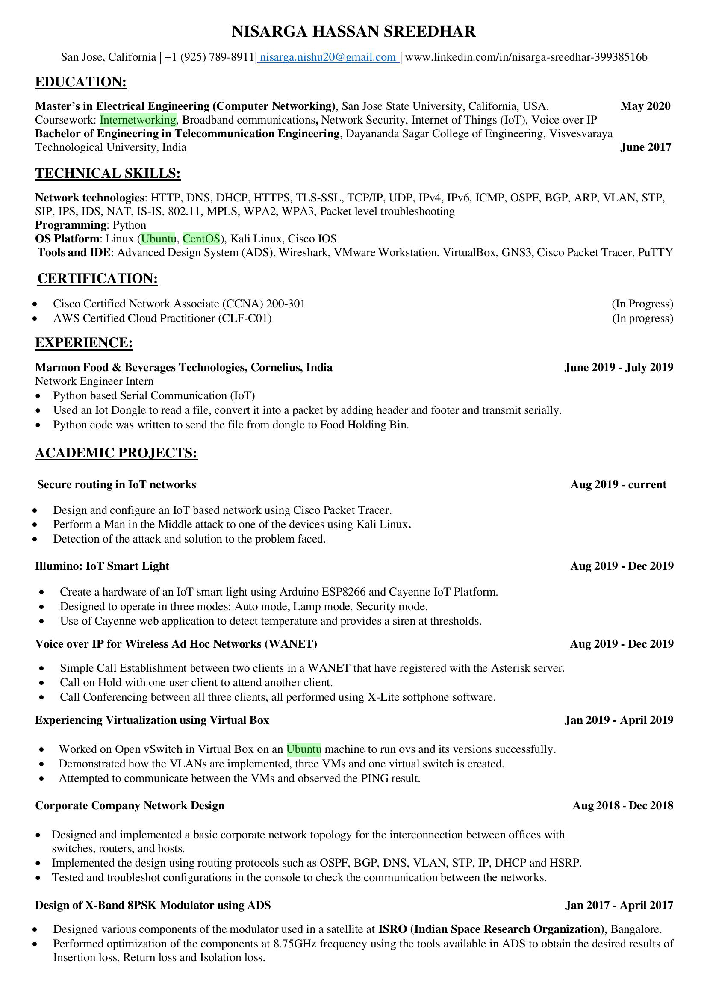

In [113]:
colorAllSkills(imagePath, skills, document)

# Automatic Entity Generated

In [114]:
resumePDFPath = '/Users/kunal/Documents/VdartResumeProject/VisionAPi/Document_402.pdf'

In [115]:
data = ResumeParser(resumePDFPath).get_extracted_data()

C:\Users\kunal\Anaconda3\lib\site-packages\spacy\util.py:275: UserWarning: [W031] Model 'en_training' (0.0.0) requires spaCy v2.1 and is incompatible with the current spaCy version (2.3.1). This may lead to unexpected results or runtime errors. To resolve this, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)


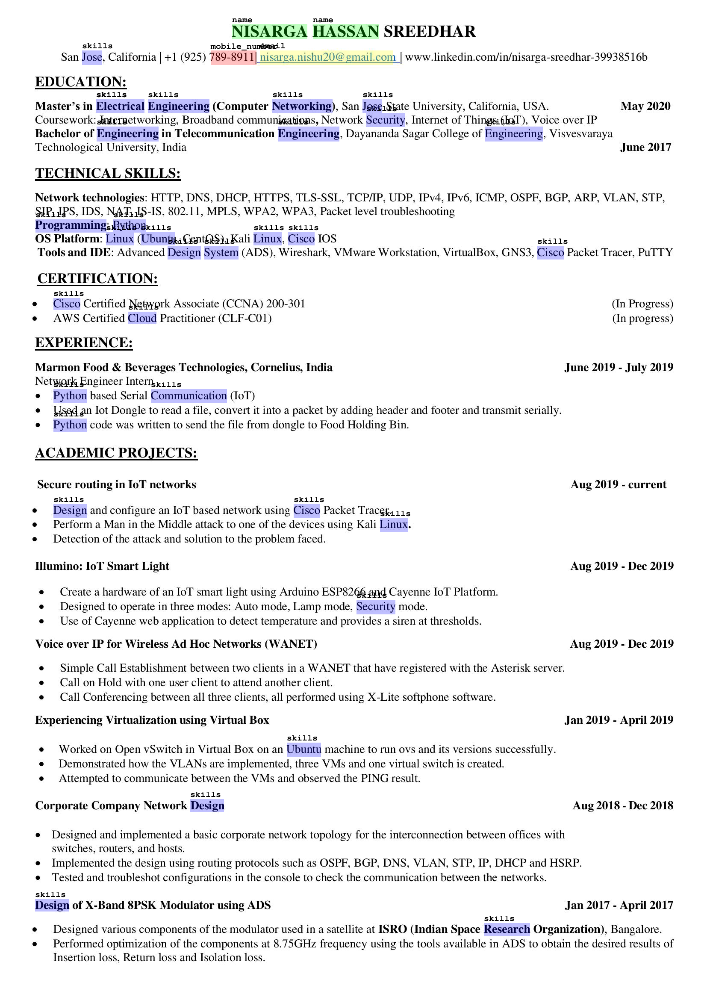

In [116]:
allWordsTotal = []
for key in data:
    if data[key] is None:
        pass
    else:
        allWordsTotal.append([data[key], key])
allWords = []
boxesTotal = []
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            for word in paragraph.words:
                wordRun = ""
                for symbol in word.symbols:
                    wordRun+=symbol.text
                allWords.append(wordRun)
                for textext in allWordsTotal:
                    if type(textext[0]) == str:
                        if textext[0] == wordRun:
                            #print(textext[1] + wordRun)
                            boxesTotal.append([word.bounding_box, textext[1]])
                            #GOT IT
                        else:
                            for wordsingle in textext[0].split():
                                if wordsingle == wordRun:
                                    #print(textext[1] + wordRun)   
                                    boxesTotal.append([word.bounding_box, textext[1]])
                    elif type(textext[0]) == list:
                        for skillSingle in textext[0]:
                            if skillSingle == wordRun:
                                #print(textext[1] + wordRun)
                                boxesTotal.append([word.bounding_box, textext[1]])
                            else:
                                for wordsingle in skillSingle.split():
                                    if wordsingle == wordRun:
                                        #print(textext[1] + wordRun)   
                                        boxesTotal.append([word.bounding_box, textext[1]])
                #if wordRun in listofSkills:
                    #boxesForSkills.append(word.bounding_box)
colors = [(0,255,0), (0,0,255), (255,0,0), (255,255,0)]
TINT_COLOR = (0,0,0) 
TRANSPARENCY = 0.25
OPACITY = int(255 * TRANSPARENCY)
img = Image.open(imagePath)
img = img.convert("RGBA")
overlay = Image.new('RGBA', img.size, TINT_COLOR+(0,))
draw = ImageDraw.Draw(overlay)  # Create a context for drawing things on it.
font = ImageFont.truetype(fontPath, size=20)
#for section in boundBoxAll:
for para in boxesTotal:
    matrix = findMatrix(para[0])
    if para[1] == "name":
         TINT_COLOR = colors[0]
    if para[1] == "skills":
         TINT_COLOR = colors[1]
    if para[1] == "mobile_number":
         TINT_COLOR = colors[2]
    if para[1] == "email":
         TINT_COLOR = colors[3]
    draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
    textLocation = (matrix[0][0], matrix[0][1]-20)
    (x, y) = textLocation
    message = para[1]
    color = 'rgb(0, 0, 0)' # black color
    draw.text((x, y), message, fill=color, font=font)
img = Image.alpha_composite(img, overlay)
img = img.convert("RGB") # Remove alpha for saving in jpg format.
img

# Using Spacy understand text and Display 

In [117]:
def detectDate(text):
    doc = nlp(text)
    for entity in doc.ents:
        if entity.label_=="DATE":
            return True
    return False
def detectDateWord(text):
    doc = nlp(text)
    for entity in doc.ents:
        if entity.label_=="DATE":
            return entity.text.split()
    return []
"""def extract_emails(text):
    doc = nlp(text)
    for token in doc:
        if token.like_email:
            resultlis.append((token.text,token.idx, token.idx + len(token)))
    return resultlis
def extract_person_names(doc):
    personL = []
    for entity in doc.ents:
        if entity.label_=="PERSON":
            personL.append([entity.text, entity.start_char, entity.end_char])
    return personL
"""

'def extract_emails(text):\n    doc = nlp(text)\n    for token in doc:\n        if token.like_email:\n            resultlis.append((token.text,token.idx, token.idx + len(token)))\n    return resultlis\ndef extract_person_names(doc):\n    personL = []\n    for entity in doc.ents:\n        if entity.label_=="PERSON":\n            personL.append([entity.text, entity.start_char, entity.end_char])\n    return personL\n'

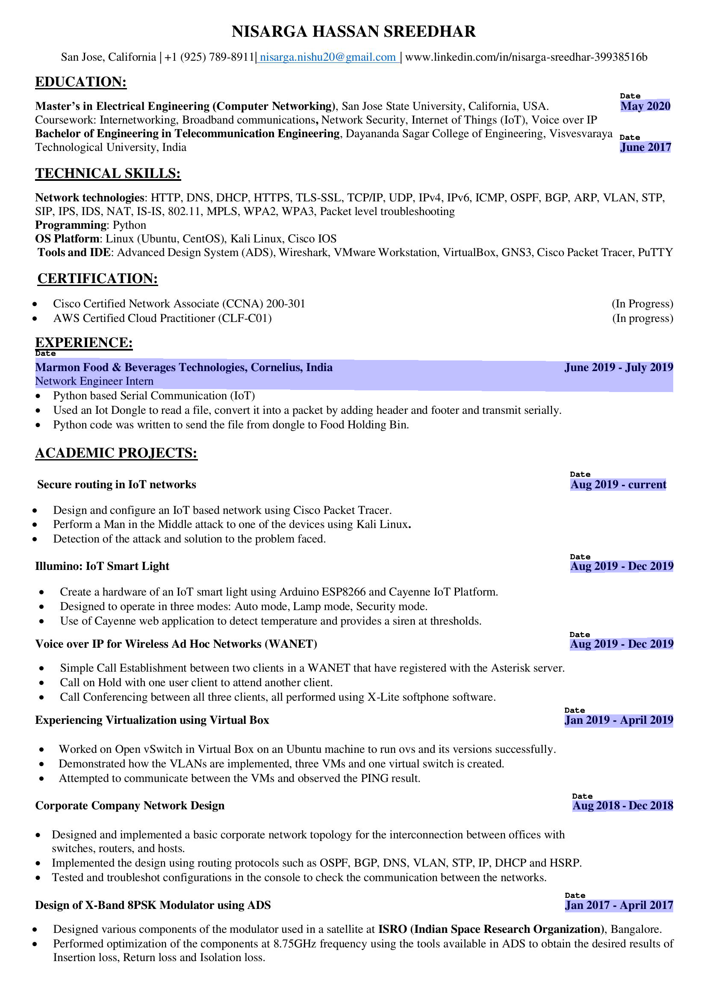

In [118]:
dateBoxes = []
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            paraRun = ""
            for word in paragraph.words:
                wordRun = ""
                for symbol in word.symbols:
                    wordRun+=symbol.text
                paraRun+=wordRun+" "
                
            if detectDate(paraRun.strip()):
                dateBoxes.append(paragraph.bounding_box)
            
color = (0,0,255)
TINT_COLOR = (0,0,0) 
TRANSPARENCY = 0.25
OPACITY = int(255 * TRANSPARENCY)
img = Image.open(imagePath)
img = img.convert("RGBA")
overlay = Image.new('RGBA', img.size, TINT_COLOR+(0,))
draw = ImageDraw.Draw(overlay)  # Create a context for drawing things on it.
font = ImageFont.truetype(fontPath, size=20)
#for section in boundBoxAll:
TINT_COLOR = color
for para in dateBoxes:
    matrix = findMatrix(para)
    textLocation = (matrix[0][0], matrix[0][1]-20)
    (x, y) = textLocation
    message = "Date"
    color = 'rgb(0, 0, 0)' # black color
    draw.text((x, y), message, fill=color, font=font)
    draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
for para in dateBoxes:
    matrix = findMatrix(para)
    textLocation = (matrix[0][0], matrix[0][1]-20)
    (x, y) = textLocation
    message = "Date"
    color = 'rgb(0, 0, 0)' # black color
    draw.text((x, y), message, fill=color, font=font)
    draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
img = Image.alpha_composite(img, overlay)
img = img.convert("RGB") # Remove alpha for saving in jpg format.
img

# Get Area of Symbols and Words to extract large words

In [119]:
areaSymbol = []
areaWord = []
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            for word in paragraph.words:
                for symbol in word.symbols:
                    #print(symbol.text+" " +str(findArea(symbol.bounding_box)))
                    areaSymbol.append(findArea(symbol.bounding_box))
                areaWord.append(findArea(word.bounding_box))

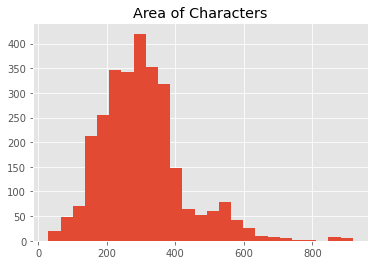

Normal size of character 290.0
Total Number of characters 2896


In [120]:
plt.style.use('ggplot')
(n, bins, patches) = plt.hist(areaSymbol, bins = 25)
plt.title("Area of Characters")
plt.show()
res = statistics.median(areaSymbol)
print("Normal size of character {}".format(res))
print("Total Number of characters {}".format(len(areaSymbol)))

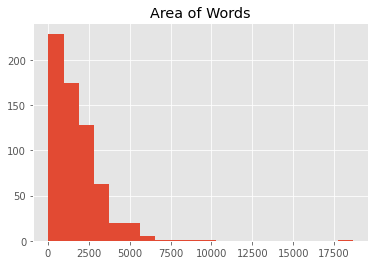

Normal size of character 1464.0
Total Number of characters 644


In [121]:
plt.style.use('ggplot')
plt.hist(areaWord, bins = 20)
plt.title("Area of Words")
plt.show()
res = statistics.median(areaWord)
print("Normal size of character {}".format(res))
print("Total Number of characters {}".format(len(areaWord)))

In [23]:
def detect_Maximum_outlier(data_1):
    #z = (X — μ) / σ
    #Formula for Z score = (Observation — Mean)/Standard Deviation
    outliers=[]
    threshold=3
    mean_1 = np.mean(data_1)
    std_1 =np.std(data_1)
    for y in data_1:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold and y > mean_1:
            outliers.append(y)
    return outliers
def findMaxOutliersIQR(datasetInput):
    dataset = sorted(datasetInput)
    q1, q3= np.percentile(dataset,[25,75])
    iqr = q3 - q1
    upper_bound = q3 +(1.5 * iqr) 
    outliers=[]
    for num in dataset:
        if num>upper_bound:
            outliers.append(num)
    return outliers
def averageOfBothOutliers(data):
    return (min(detect_Maximum_outlier(data)) + min(findMaxOutliersIQR(data)))/2

In [24]:
#symbolOutlierAverage = min(detect_Maximum_outlier(areaSymbol))
#symbolOutilerAverage = min(findMaxOutliersIQR(areaSymbol))averageOfBothOutliers(data)
symbolOutlierAverage = averageOfBothOutliers(areaSymbol)
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            for word in paragraph.words:
                runningWord = ""
                listofSymbolsAreas = []
                for symbol in word.symbols:
                    #print(symbol.text+" " +str(findArea(symbol.bounding_box)))
                    if findArea(symbol.bounding_box)>symbolOutlierAverage:
                        #print(symbol.text)
                        countSymbolBig = True
                        listofSymbolsAreas.append(findArea(symbol.bounding_box))
                    else:
                        countSymbolBig = False
                    runningWord+=symbol.text
                if countSymbolBig and sum(listofSymbolsAreas)/len(listofSymbolsAreas) > symbolOutilerAverage:
                    print(runningWord + "\t\tAREA\t" +  str(findArea(word.bounding_box)) + "\t\t\tAVERAGE\t" + 
                         str(sum(listofSymbolsAreas)/len(listofSymbolsAreas)))

NameError: name 'areaSymbol' is not defined

In [25]:
boundingBoxForLarge = []
#symbolOutilerAverage = min(findMaxOutliersIQR(areaSymbol))averageOfBothOutliers(data)
symbolOutilerAverage = averageOfBothOutliers(areaSymbol)
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            for word in paragraph.words:
                runningWord = ""
                listofSymbolsAreas = []
                for symbol in word.symbols:
                    #print(symbol.text+" " +str(findArea(symbol.bounding_box)))
                    if findArea(symbol.bounding_box)>symbolOutlierAverage:
                        #print(symbol.text)
                        countSymbolBig = True
                        listofSymbolsAreas.append(findArea(symbol.bounding_box))
                    else:
                        countSymbolBig = False
                    runningWord+=symbol.text
                if countSymbolBig and sum(listofSymbolsAreas)/len(listofSymbolsAreas) > symbolOutilerAverage:
                    #print(runningWord + "\t" +  str(findArea(word.bounding_box)))
                    #print(sum(listofSymbolsAreas)/len(listofSymbolsAreas))
                    boundingBoxForLarge.append(word.bounding_box)
color = (0,0,255)
TINT_COLOR = (0,0,0) 
TRANSPARENCY = 0.25
OPACITY = int(255 * TRANSPARENCY)
img = Image.open(imagePath)
img = img.convert("RGBA")
overlay = Image.new('RGBA', img.size, TINT_COLOR+(0,))
draw = ImageDraw.Draw(overlay)  # Create a context for drawing things on it.
font = ImageFont.truetype(fontPath, size=20)
#for section in boundBoxAll:
TINT_COLOR = color
for large in boundingBoxForLarge:
    matrix = findMatrix(large)
    textLocation = (matrix[0][0], matrix[0][1]-20)
    (x, y) = textLocation
    message = "BigWord"
    color = 'rgb(0, 0, 0)' # black color
    draw.text((x, y), message, fill=color, font=font)
    draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
img = Image.alpha_composite(img, overlay)
img = img.convert("RGB") # Remove alpha for saving in jpg format.
img

NameError: name 'areaSymbol' is not defined

# Highlight Capital Large Letter

In [26]:
lsttester = []
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            for word in paragraph.words:
                runningWord = ""
                uppercaseLetterCt = 0
                totalSymbolsLeterCt = 0
                for symbol in word.symbols:
                    if symbol.text.isupper():
                        uppercaseLetterCt+=1
                    totalSymbolsLeterCt+=1
                    runningWord+=symbol.text
                if uppercaseLetterCt == totalSymbolsLeterCt:
                    lsttester.append(findArea(word.bounding_box))
thresholdAreaCapitailWord = min(findMaxOutliersIQR(lsttester))                 

In [28]:
thresholdAreaCapitailWord

5236.0

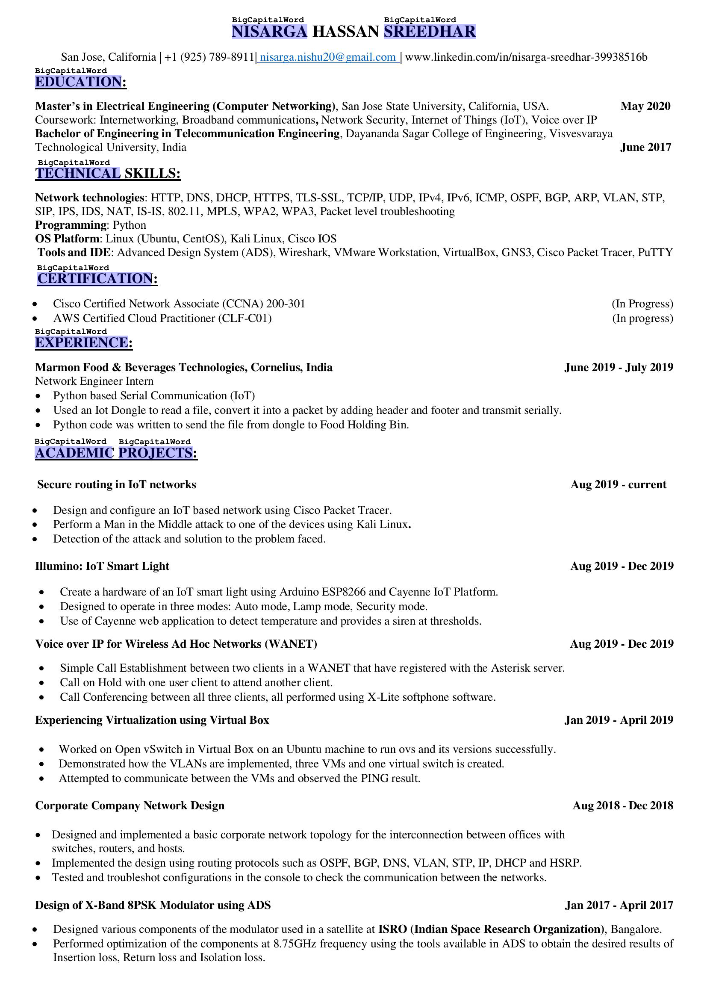

In [128]:
boundingBoxForLargeCapital = []
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            for word in paragraph.words:
                runningWord = ""
                uppercaseLetterCt = 0
                totalSymbolsLeterCt = 0
                for symbol in word.symbols:
                    if symbol.text.isupper():
                        uppercaseLetterCt+=1
                    totalSymbolsLeterCt+=1
                    runningWord+=symbol.text
                if uppercaseLetterCt == totalSymbolsLeterCt and findArea(word.bounding_box) > thresholdAreaCapitailWord:
                    #print(runningWord)
                    #print(findArea(word.bounding_box))
                    boundingBoxForLargeCapital.append(word.bounding_box)
color = (0,0,255)
TINT_COLOR = (0,0,0) 
TRANSPARENCY = 0.25
OPACITY = int(255 * TRANSPARENCY)
img = Image.open(imagePath)
img = img.convert("RGBA")
overlay = Image.new('RGBA', img.size, TINT_COLOR+(0,))
draw = ImageDraw.Draw(overlay)  # Create a context for drawing things on it.
font = ImageFont.truetype(fontPath, size=20)
#for section in boundBoxAll:
TINT_COLOR = color
for large in boundingBoxForLargeCapital:
    matrix = findMatrix(large)
    textLocation = (matrix[0][0], matrix[0][1]-20)
    (x, y) = textLocation
    message = "BigCapitalWord"
    color = 'rgb(0, 0, 0)' # black color
    draw.text((x, y), message, fill=color, font=font)
    draw.polygon(matrix, fill=TINT_COLOR+(OPACITY,))
img = Image.alpha_composite(img, overlay)
img = img.convert("RGB") # Remove alpha for saving in jpg format.
img

# Trying to understand how to comprehend Data

In [239]:
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            paraRun = ""
            for word in paragraph.words:
                wordRun = ""
                numSymbols = 0
                for symbol in word.symbols:
                    wordRun+=symbol.text
                    numSymbols+=1
                paraRun+=wordRun+" "
                print(wordRun+" " +str(findArea(word.bounding_box)))

NISARGA 5808.0
HASSAN 5115.0
SREEDHAR 7029.0
San 1248.0
Jose 1472.0
, 96.0
California 3552.0
| 32.0
+1 800.0
( 192.0
925 1216.0
) 192.0
789-8911 3424.0
| 256.0
nisarga.nishu20@gmail.com 9696.0
| 256.0
www.linkedin.com/in/nisarga-sreedhar-39938516b 18112.0
EDUCATION 5829.0
: 145.0
May 1561.0
2020 1622.0
Master's 3264.0
in 640.0
Electrical 3584.0
Engineering 4576.0
( 224.0
Computer 3840.0
Networking 4448.0
) 192.0
, 192.0
San 1216.0
Jose 1440.0
State 1664.0
University 3680.0
, 64.0
California 3488.0
, 160.0
USA 1696.0
. 64.0
Coursework 4092.0
: 124.0
Internetworking 5518.0
, 186.0
Broadband 3689.0
communications 5611.0
, 186.0
Network 3007.0
Security 2790.0
, 124.0
Internet 2573.0
of 713.0
Things 2325.0
( 217.0
IoT 1178.0
) 186.0
, 93.0
Voice 1953.0
over 1488.0
IP 713.0
Bachelor 3675.0
of 805.0
Engineering 5005.0
in 770.0
Telecommunication 8120.0
Engineering 5005.0
, 70.0
Dayananda 4305.0
Sagar 2135.0
College 2905.0
of 805.0
Engineering 4655.0
, 105.0
Visvesvaraya 5145.0
Technological 48

In [237]:
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            paraRun = ""
            wordCount = 0
            areaListEachWord = []
            for word in paragraph.words:
                wordRun = ""
                for symbol in word.symbols:
                    wordRun+=symbol.text
                paraRun+=wordRun+" "
                areaListEachWord.append(findArea(word.bounding_box))
                wordCount+=1
            print(str(wordCount) + " "+ str(sum(areaListEachWord)) + " " +str(findArea(paragraph.bounding_box)))
            print(paraRun)
            print(sum(areaListEachWord) / len(areaListEachWord))
            print("\n")

3 17952.0 18810.0
NISARGA HASSAN SREEDHAR 
5984.0


14 40544.0 43840.0
San Jose , California | +1 ( 925 ) 789-8911 | nisarga.nishu20@gmail.com | www.linkedin.com/in/nisarga-sreedhar-39938516b 
2896.0


2 5974.0 6119.0
EDUCATION : 
2987.0


2 3183.0 3453.0
May 2020 
1591.5


56 124964.0 171450.0
Master's in Electrical Engineering ( Computer Networking ) , San Jose State University , California , USA . Coursework : Internetworking , Broadband communications , Network Security , Internet of Things ( IoT ) , Voice over IP Bachelor of Engineering in Telecommunication Engineering , Dayananda Sagar College of Engineering , Visvesvaraya Technological University , India 
2231.5


2 2834.0 3068.0
June 2017 
1417.0


3 9600.0 9990.0
TECHNICAL SKILLS : 
3200.0


103 127020.0 240212.0
Network technologies : HTTP , DNS , DHCP , HTTPS , TLS - SSL , TCP / IP , UDP , IPv4 , IPv6 , MP , OSPF , BGP , ARP , VLAN , STP , SIP , IPS , IDS , NAT , IS - IS , 802.11 , MPLS , WPA2 , WPA3 , Packet level troublesh

In [223]:
5808.0 + 5115.0 + 7029.0

17952.0

In [211]:
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            paraRun = ""
            for word in paragraph.words:
                wordRun = ""
                for symbol in word.symbols:
                    wordRun+=symbol.text
                paraRun+=wordRun+" "
            print(paraRun)

[[vertices {
    x: 536
    y: 56
  }
  vertices {
    x: 1106
    y: 56
  }
  vertices {
    x: 1106
    y: 89
  }
  vertices {
    x: 536
    y: 89
  }, vertices {
    x: 138
    y: 119
  }
  vertices {
    x: 1508
    y: 119
  }
  vertices {
    x: 1508
    y: 151
  }
  vertices {
    x: 138
    y: 151
  }, vertices {
    x: 76
    y: 175
  }
  vertices {
    x: 287
    y: 175
  }
  vertices {
    x: 287
    y: 204
  }
  vertices {
    x: 76
    y: 204
  }, vertices {
    x: 1445
    y: 233
  }
  vertices {
    x: 1560
    y: 230
  }
  vertices {
    x: 1561
    y: 260
  }
  vertices {
    x: 1446
    y: 263
  }, vertices {
    x: 76
    y: 233
  }
  vertices {
    x: 1426
    y: 233
  }
  vertices {
    x: 1426
    y: 360
  }
  vertices {
    x: 76
    y: 360
  }, vertices {
    x: 1444
    y: 331
  }
  vertices {
    x: 1562
    y: 329
  }
  vertices {
    x: 1562
    y: 355
  }
  vertices {
    x: 1444
    y: 357
  }, vertices {
    x: 83
    y: 389
  }
  vertices {
    x: 416
  

# Tesseract Other

In [ ]:
from tesserocr import PyTessBaseAPI

images = ['/Users/kunal/Documents/VdartResumeProject/VisionAPi/Document_402_1_2.jpg']

with PyTessBaseAPI() as api:
    for img in images:
        api.SetImageFile(img)
        print(api.GetUTF8Text())
        print(api.AllWordConfidences())

In [ ]:
import tesserocr
from PIL import Image

print(tesserocr.tesseract_version())  # print tesseract-ocr version
print(tesserocr.get_languages())  # prints tessdata path and list of available languages

image = Image.open(imagePath)
print(tesserocr.image_to_text(image))  # print ocr text from image
# or
print(tesserocr.file_to_text('sample.jpg'))

In [ ]:
from PIL import Image
from tesserocr import PyTessBaseAPI, RIL

image = Image.open(imagePath)
with PyTessBaseAPI() as api:
    api.SetImage(image)
    boxes = api.GetComponentImages(RIL.TEXTLINE, True)
    print('Found {} textline image components.'.format(len(boxes)))
    for i, (im, box, _, _) in enumerate(boxes):
        # im is a PIL image object
        # box is a dict with x, y, w and h keys
        api.SetRectangle(box['x'], box['y'], box['w'], box['h'])
        ocrResult = api.GetUTF8Text()
        conf = api.MeanTextConf()
        print(u"Box[{0}]: x={x}, y={y}, w={w}, h={h}, "
              "confidence: {1}, text: {2}".format(i, conf, ocrResult, **box))

In [ ]:
from PIL import Image
from tesserocr import PyTessBaseAPI, PSM

with PyTessBaseAPI(psm=PSM.AUTO_OSD) as api:
    image = Image.open(imagePath)
    api.SetImage(image)
    api.Recognize()

    it = api.AnalyseLayout()
    orientation, direction, order, deskew_angle = it.Orientation()
    print("Orientation: {:d}".format(orientation))
    print("WritingDirection: {:d}".format(direction))
    print("TextlineOrder: {:d}".format(order))
    print("Deskew angle: {:.4f}".format(deskew_angle))

In [ ]:
from tesserocr import PyTessBaseAPI, PSM

with PyTessBaseAPI(psm=PSM.OSD_ONLY) as api:
    api.SetImageFile(imagePath)

    os = api.DetectOS()
    print("Orientation: {orientation}\nOrientation confidence: {oconfidence}\n"
          "Script: {script}\nScript confidence: {sconfidence}".format(**os))

In [ ]:
from tesserocr import PyTessBaseAPI, PSM, OEM

with PyTessBaseAPI(psm=PSM.OSD_ONLY, oem=OEM.LSTM_ONLY) as api:
    api.SetImageFile(imagePath)

    os = api.DetectOrientationScript()
    print("Orientation: {orient_deg}\nOrientation confidence: {orient_conf}\n"
          "Script: {script_name}\nScript confidence: {script_conf}".format(**os))

In [ ]:
from __future__ import print_function

from tesserocr import PyTessBaseAPI, RIL, iterate_level

with PyTessBaseAPI() as api:
    api.SetImageFile(imagePath)
    api.SetVariable("save_blob_choices", "T")
    api.SetRectangle(37, 228, 548, 31)
    api.Recognize()

    ri = api.GetIterator()
    level = RIL.SYMBOL
    for r in iterate_level(ri, level):
        symbol = r.GetUTF8Text(level)  # r == ri
        conf = r.Confidence(level)
        if symbol:
            print(u'symbol {}, conf: {}'.format(symbol, conf), end='')
        indent = False
        ci = r.GetChoiceIterator()
        for c in ci:
            if indent:
                print('\t\t ', end='')
            print('\t- ', end='')
            choice = c.GetUTF8Text()  # c == ci
            print(u'{} conf: {}'.format(choice, c.Confidence()))
            indent = True
        print('---------------------------------------------')

# Other

In [ ]:
keyDIR = imgTxtVisionAPIPath #JSON key file to call the api
credentials = service_account.Credentials.from_service_account_file(keyDIR) #using service account to go through google
client = vision.ImageAnnotatorClient(credentials=credentials) # client api

bounds = []

with io.open(image_file, 'rb') as image_file:
    content = image_file.read()

image = types.Image(content=content)

response = client.document_text_detection(image=image)
document = response.full_text_annotation



In [ ]:
numBlocks = 0
totalText = []
# Collect specified feature bounds by enumerating all document features
for page in document.pages:
    for block in page.blocks:
        #block.append(block.bounding_box)
        #print(block)
        if block.paragraphs:
            numBlocks+=1
        textRunning = ""
        for paragraph in block.paragraphs:
            for word in paragraph.words:
                for symbol in word.symbols:
                    textRunning+=symbol.text
                textRunning+=" "
        totalText.append(textRunning)

In [ ]:
totalText

In [ ]:
len(para)

In [ ]:
block = []
para = []
word = []
# Collect specified feature bounds by enumerating all document features
for page in document.pages:
    for block in page.blocks:
        for paragraph in block.paragraphs:
            for word in paragraph.words:
                for symbol in word.symbols:
                    print(symbol.text)
                print(word.end)

In [ ]:
"""with io.open(imagePath, 'rb') as image_file: #opening and reading img
    content = image_file.read() 
image = vision.types.Image(content=content) # calling and running the client Visison API
response = client.text_detection(image=image) # JSON return with all values
response4 = client.document_text_detection(image = image)"""

In [ ]:
"""numblock = 0
for i in response4.full_text_annotation.pages:
    for j in i.blocks:
        numpara = 0
        #print(j.confidence)
        for g in j.paragraphs:
            numpara+=1
            word = ""
            for x in g.words:
                for y in x.symbols:
                    #print("RUN " + str(y.property.detected_break.type))
                    #print("RUN " + str(y.property.detected_break))
                    word+=y.text
                    if y.property.detected_break.type == 1:#space
                        word+=" "
                    elif y.property.detected_break.type == 5:#line_break
                        print("")
                    elif y.property.detected_break.type == 3:#EOL_SURE_SPACE
                        print("SOMETHINGHERE")
                        #print(y.property)
            print(word)
        #print(numpara)
        #print(" ")
        numblock+=1
#print(numblock)"""